<a href="https://colab.research.google.com/github/forbiddenvelocity/Anime-face-GAN/blob/main/AnimeGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mubaash","key":"46e918495147aa4db5bb969db41f83ec"}'}

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [3]:
!kaggle datasets download splcher/animefacedataset

100% 393M/395M [00:11<00:00, 38.1MB/s]
100% 395M/395M [00:11<00:00, 35.1MB/s]


In [4]:
!unzip -q -d dataset animefacedataset.zip

In [5]:
!pip install wandb
!wandb login

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.5/263.5 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.5 MB/s eta 0:00:00
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [6]:
import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

from torchsummary import summary
import wandb

import os, shutil
import imageio
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

print('Pytorch Version:', torch.__version__)
print('GPU Available:', torch.cuda.is_available())

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Setting device to:', device)

import os

ckpt_root = 'drive/My Drive/Model-Checkpoints/Fake Anime - Pytorch'
os.makedirs(ckpt_root, exist_ok=True)
print('Checkpoint directory created or already exists.')


ckpt_root = 'drive/My Drive/Model-Checkpoints/Fake Anime - Pytorch'
if not os.path.isdir(ckpt_root):
    os.mkdir(ckpt_root)
    print('Making checkpoint dir for first time...')

progress_dir = os.path.join(ckpt_root, 'progress')
if not os.path.isdir(progress_dir):
    os.mkdir(progress_dir)
    print('Making progress dir for first time...')

Pytorch Version: 2.2.1+cu121
GPU Available: True
Setting device to: cuda
Checkpoint directory created or already exists.
Making progress dir for first time...


In [7]:
train_images = ImageFolder('dataset', transform = transforms.Compose([transforms.Resize(136),
                                                                     transforms.CenterCrop(128),
                                                                     transforms.RandomHorizontalFlip(),
                                                                     transforms.ToTensor(),
                                                                     transforms.Normalize((.5, .5, .5), (.5, .5, .5))]))


In [8]:
def visualize_image(image):
    plt.figure(figsize = (5, 5))
    image = (image + 1) / 2

    plt.imshow(image.permute(1, 2, 0))
    plt.axis('off')
    plt.show()

def visualize_batch(images_list, size = 14, shape = (6, 6), title = None, save = None, return_images = False):
    images_list = (images_list - images_list.min())/(images_list.max() - images_list.min())

    fig = plt.figure(figsize = (size, size))
    grid = ImageGrid(fig, 111, nrows_ncols = shape, axes_pad = 0.04)
    for ax, image in zip(grid, images_list):
        ax.imshow(image.permute(1, 2, 0))
        ax.axis('off')

    if title:
        print(title)
    if save:
        plt.savefig(save)
    plt.show()

    if return_images:
        return images_list

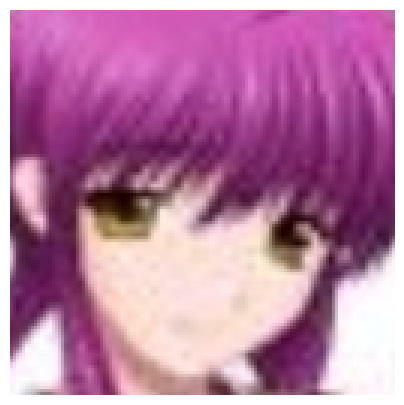

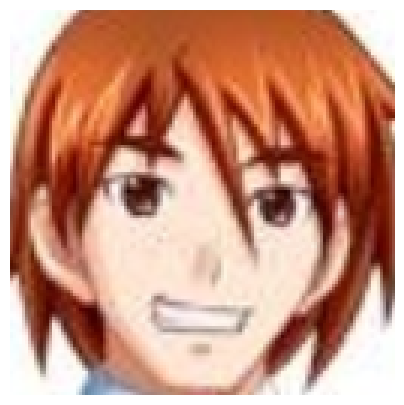

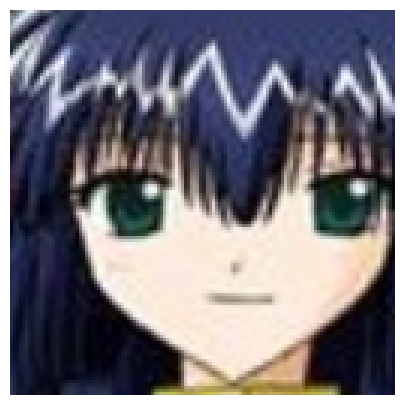

In [9]:
x, _ = train_images[3]
visualize_image(x)

x, _ = train_images[4]
visualize_image(x)

x, _ = train_images[5]
visualize_image(x)

In [10]:
batch_size = 128
train_data = DataLoader(train_images, batch_size = batch_size, shuffle = True, drop_last = True)

In [11]:
for x, _ in train_data:
    break

print(x.shape, x.min(), x.max())

torch.Size([128, 3, 128, 128]) tensor(-1.) tensor(1.)


Training Batch Samples


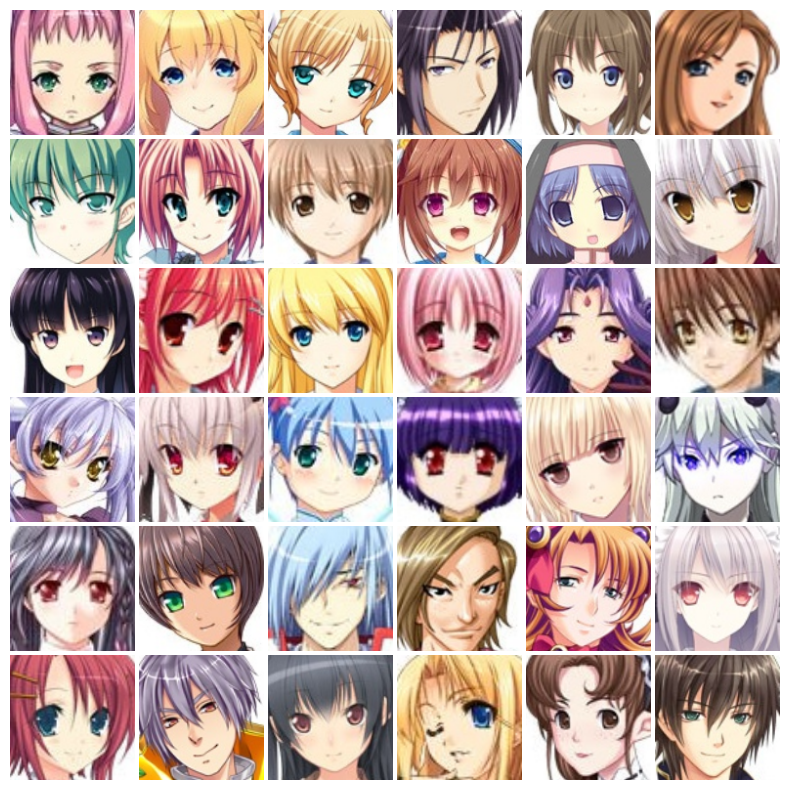

In [12]:
visualize_batch(x[:36], shape = (6, 6), size = 10, title = 'Training Batch Samples')

In [13]:
class Discriminator(nn.Module):
    def __init__(self, maps = 64):
        super(Discriminator, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, maps, 4, 2, 1),
            nn.LeakyReLU(0.2), # shape -> maps, 64, 64

            nn.Conv2d(maps, 2 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(2 * maps),
            nn.LeakyReLU(0.2), # shape -> 2 * maps, 32, 32

            nn.Conv2d(2 * maps, 4 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(4 * maps),
            nn.LeakyReLU(0.2), # shape -> 4 * maps, 16, 16

            nn.Conv2d(4 * maps, 8 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(8 * maps),
            nn.LeakyReLU(0.2), # shape -> 8 * maps, 8, 8

            nn.Conv2d(8 * maps, 16 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(16 * maps),
            nn.LeakyReLU(0.2), # shape -> 16 * maps, 4, 4
        )

        self.outputs = nn.Sequential(
            nn.Conv2d(16 * maps, 1, 4, 1, 0),
            nn.Flatten()
        )

    def forward(self, x):
        x = self.features(x)
        return self.outputs(x)

In [14]:
class Generator(nn.Module):
    def __init__(self, maps = 64, noise_size = 128):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            nn.ConvTranspose2d(noise_size, 16 * maps, 4, 1, 0, bias = False),
            nn.BatchNorm2d(16 * maps),
            nn.ReLU(), # shape -> 16 * maps, 4, 4

            nn.ConvTranspose2d(16 * maps, 8 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(8 * maps),
            nn.ReLU(), # shape -> 8 * maps, 8, 8

            nn.ConvTranspose2d(8 * maps, 4 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(4 * maps),
            nn.ReLU(), # shape -> 4 * maps, 16, 16

            nn.ConvTranspose2d(4 * maps, 2 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(2 * maps),
            nn.ReLU(), # shape -> 2 * maps, 32, 32

            nn.ConvTranspose2d(2 * maps, maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(maps),
            nn.ReLU(), # shape -> maps, 64, 64

            nn.ConvTranspose2d(maps, 3, 4, 2, 1),
            nn.Tanh() # shape -> 3, 128, 128
        )

    def forward(self, z):
        z = z.view(-1, 128, 1, 1)
        return self.model(z)

In [15]:
discriminator = Discriminator(maps = 64).to(device)
summary(discriminator, (3, 128, 128))
noise_size = 128
generator = Generator(maps = 64, noise_size = noise_size).to(device)
summary(generator, [[noise_size]])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           3,136
         LeakyReLU-2           [-1, 64, 64, 64]               0
            Conv2d-3          [-1, 128, 32, 32]         131,072
       BatchNorm2d-4          [-1, 128, 32, 32]             256
         LeakyReLU-5          [-1, 128, 32, 32]               0
            Conv2d-6          [-1, 256, 16, 16]         524,288
       BatchNorm2d-7          [-1, 256, 16, 16]             512
         LeakyReLU-8          [-1, 256, 16, 16]               0
            Conv2d-9            [-1, 512, 8, 8]       2,097,152
      BatchNorm2d-10            [-1, 512, 8, 8]           1,024
        LeakyReLU-11            [-1, 512, 8, 8]               0
           Conv2d-12           [-1, 1024, 4, 4]       8,388,608
      BatchNorm2d-13           [-1, 1024, 4, 4]           2,048
        LeakyReLU-14           [-1, 102

In [16]:
def initializer(module):
    classname = module.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(module.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(module.weight.data, 0.0, 0.02)
        nn.init.constant_(module.bias.data, 0.0)

discriminator.apply(initializer), generator.apply(initializer)

print('Initialization done...')


Initialization done...


In [17]:
ones = torch.ones(batch_size, 1).to(device)
zeros = torch.zeros(batch_size, 1).to(device)

def discrinimator_loss(true, false):
    return F.binary_cross_entropy_with_logits(true, ones) + F.binary_cross_entropy_with_logits(false, zeros)

def generator_loss(false):
    return F.binary_cross_entropy_with_logits(false, ones)

In [18]:
epochs = 50
lr = 0.0004

discriminator_optimizer = optim.Adam(discriminator.parameters(), lr = lr, betas = (0.5, 0.999))
generator_optimizer = optim.Adam(generator.parameters(), lr = lr, betas = (0.5, 0.999))

In [19]:
def save_checkpoint(epoch = 0, batch_index = 0):
    ckpt = {
        'fixed_z': fixed_z.cpu(),
        'generator': generator.state_dict(),
        'discriminator': discriminator.state_dict(),
        'generator_optimizer': generator_optimizer.state_dict(),
        'discriminator_optimizer': discriminator_optimizer.state_dict(),
        'epoch': epoch,
        'batch_index': batch_index
    }

    torch.save(ckpt, os.path.join(ckpt_root, 'ckpt.pth'))

def load_checkpoint():
    ckpt = torch.load(os.path.join(ckpt_root, 'ckpt.pth'))

    fixed_z = ckpt['fixed_z'].to(device)

    generator.load_state_dict(ckpt['generator'])
    discriminator.load_state_dict(ckpt['discriminator'])

    generator_optimizer.load_state_dict(ckpt['generator_optimizer'])
    discriminator_optimizer.load_state_dict(ckpt['discriminator_optimizer'])

    epoch = ckpt['epoch']
    batch_index = ckpt['batch_index']

    return fixed_z, epoch, batch_index

In [20]:
def random_noise(size):
    return torch.normal(0, 1, size, device = device)


In [23]:
fixed_z, start_epoch, start_batch_index = load_checkpoint()
print(f'Continuing from epoch {start_epoch} and batch index {start_batch_index}')

Continuing from epoch 0 and batch index 0


In [22]:
fixed_z = random_noise([36, noise_size])
save_checkpoint()

In [24]:
wandb_id = wandb.util.generate_id()
wandb_id = "2yp1ov6h"
print(wandb_id)
wandb.init(id = wandb_id, project = "Fake Anime - Pytorch", name = "Run 1")
wandb.config.update({
    'initial_lr': lr,
    'noise_size': noise_size,
    'initialization': 'Normal Distribution',
    'beta1': 0.5,
})

2yp1ov6h


wandb: Currently logged in as: mubashir1728. Use `wandb login --relogin` to force relogin


In [ ]:
!pip install tqdm

In [25]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device available:", device)

Device available: cuda



Showing Generated Samples



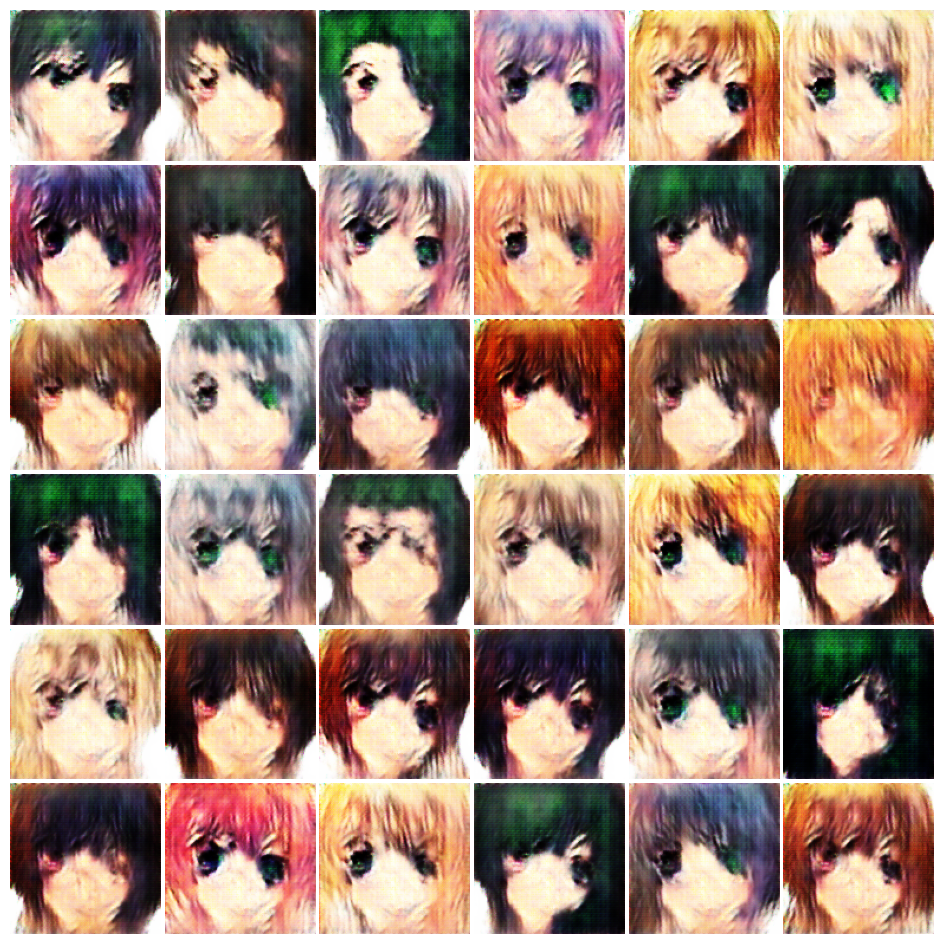


Epoch: 5
Generator Loss        : 4.46265
Discriminator Loss    : 0.70400


TypeError: unsupported operand type(s) for -: 'str' and 'int'

TypeError: unsupported operand type(s) for -: 'str' and 'int'


Showing Generated Samples



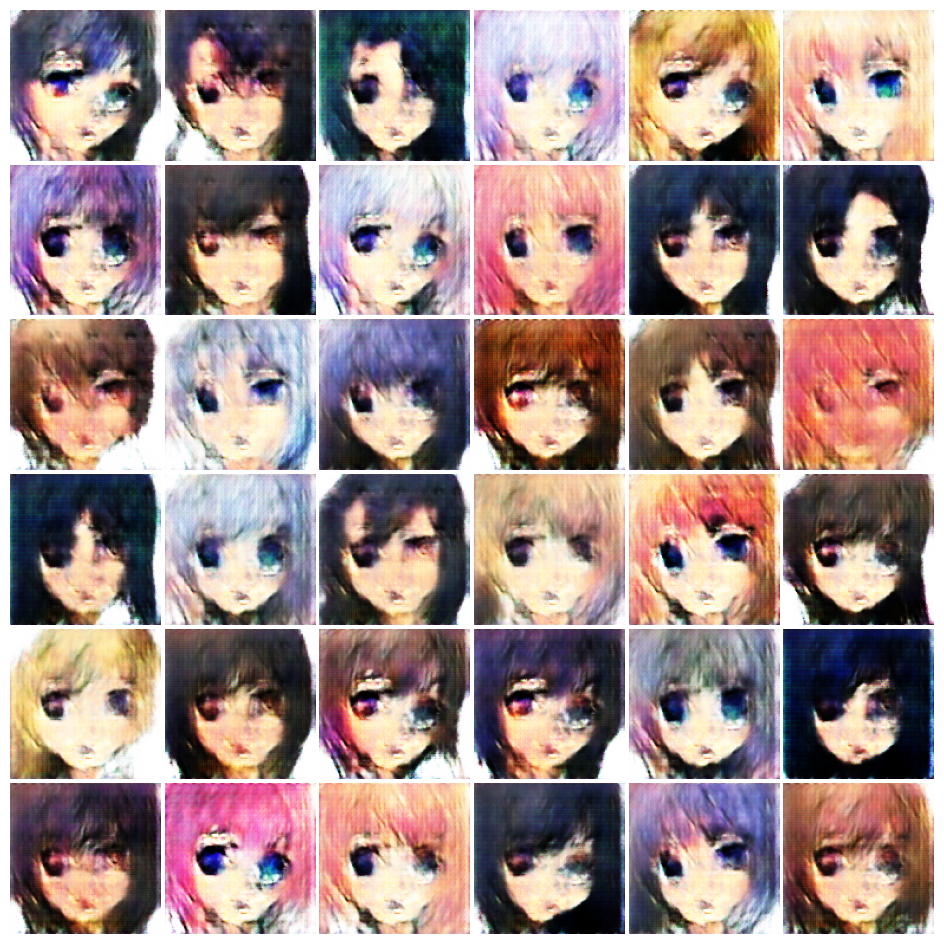


Showing Generated Samples



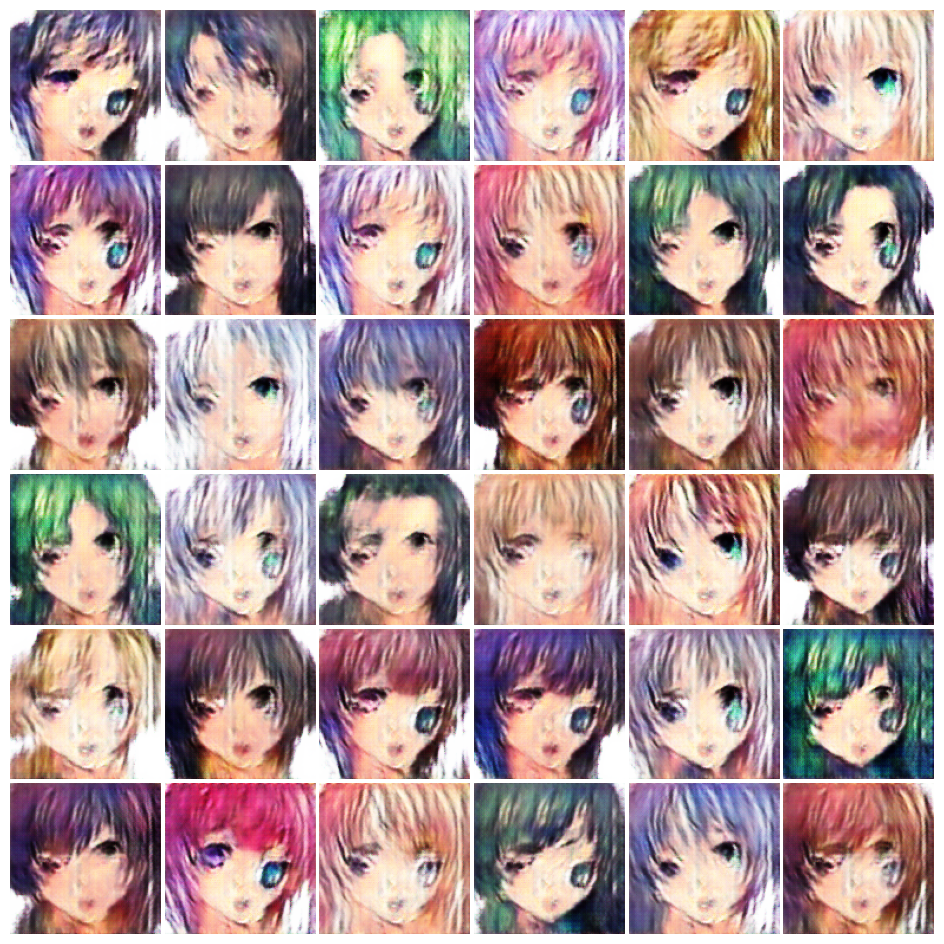


Showing Generated Samples



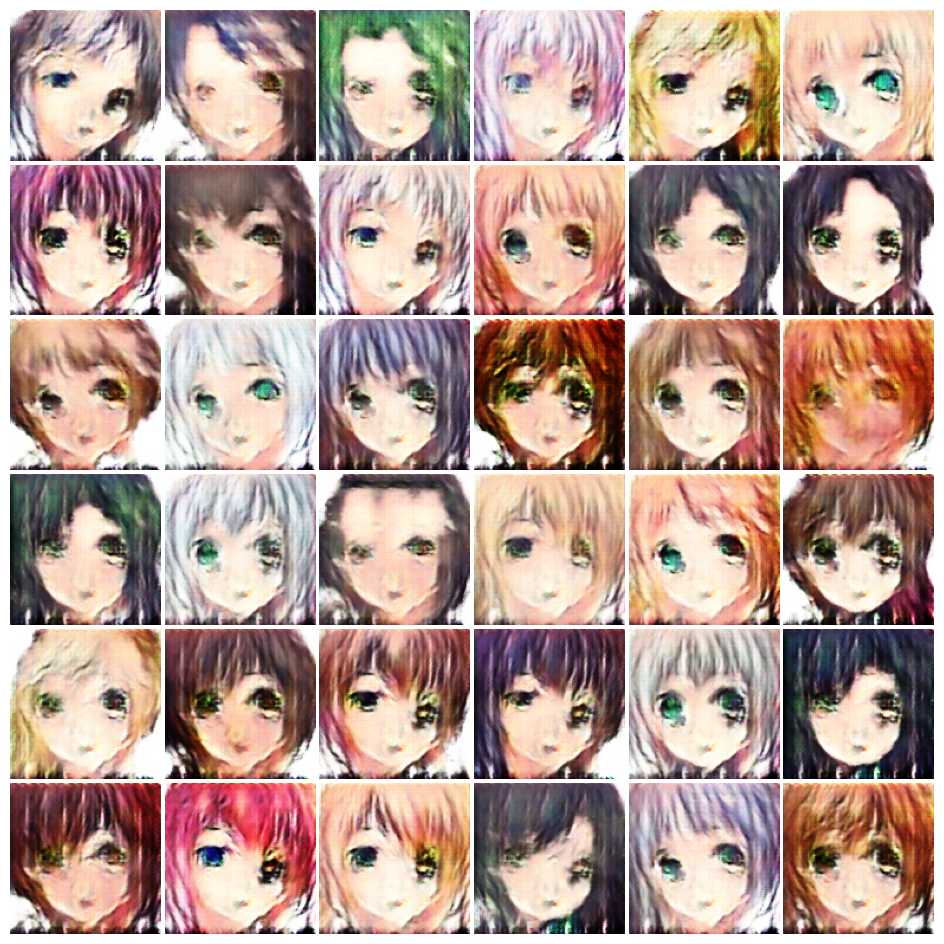

KeyboardInterrupt: 

In [26]:
nan_break = False

discriminator.train()
generator.train()

for epoch in range(start_epoch, epochs):
    dcum_loss = 0.0
    gcum_loss = 0.0

    dataloader = tqdm(train_data, desc = f'Epoch({epoch + 1}/{epochs})', ncols = '900')

    for batch_index, (true_images, _) in enumerate(dataloader, start_batch_index):
        batch_size = true_images.size(0)
        true_images = true_images.cuda()

        # [=========== Training Discriminator ===========]
        discriminator_optimizer.zero_grad()

        true = discriminator(true_images)

        false_images = generator(random_noise([batch_size, 128]))
        false = discriminator(false_images)

        d_loss = discrinimator_loss(true, false)
        d_loss.backward()
        discriminator_optimizer.step()

        # [============= Training Generator =============]
        generator_optimizer.zero_grad()

        false_images = generator(random_noise([batch_size, 128]))

        false = discriminator(false_images)
        g_loss = generator_loss(false)
        g_loss.backward()
        generator_optimizer.step()

        dataloader.set_postfix(d_loss = d_loss.item(), g_loss = g_loss.item())

        with torch.no_grad():
            dcum_loss += d_loss.item()
            gcum_loss += g_loss.item()

            wandb.log({'d_loss': d_loss.item(), 'g_loss': g_loss.item()})

            if (batch_index + 1) % (len(train_data) // 4) == 0 and batch_index != start_batch_index:
                generator.eval()
                false_images = generator(fixed_z).cpu()
                path_name = f"epoch({str(epoch + 1).zfill(len(str(epochs)))})-batch({str(batch_index + 1).zfill(len(str(len(train_data))))}).jpg"
                generator_images = visualize_batch(false_images,
                                                   shape = (6, 6),
                                                   size = 12,
                                                   save = os.path.join(progress_dir, path_name),
                                                   return_images = True,
                                                   title = "\nShowing Generated Samples\n")
                save_checkpoint

        if d_loss != d_loss or g_loss != g_loss:
            nan_break = True
            break

        if batch_index == len(train_data) - 1:
            break

    if nan_break:
        print(f'Nan loss occured at   : {epoch + 1}')
        print(f'Generator Loss        : {gcum_loss}')
        print(f'Discriminator Loss    : {dcum_loss}')
        break

    start_batch_index = 0

    print(f'\nEpoch: {epoch + 1}')
    print(f'Generator Loss        : {(gcum_loss/len(train_data)):.5f}')
    print(f'Discriminator Loss    : {(dcum_loss/len(train_data)):.5f}')